In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision

In [6]:
backbone = torchvision.models.efficientnet_b4(weights=None)
print(backbone)

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

In [2]:
PATH_TO_DATASET = '../../../../../DataSet/S2MTCP/'
FNAME = 'S2MTCP_metadata.csv'

In [3]:
import os
import csv
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

In [4]:
def get_s2mtcp_image(img_path):
    image = torch.from_numpy(np.load(img_path)).float()
    image = torch.einsum('ijk->kij',image)
    image = image[0:13,:,:]
    return image

In [5]:
def get_rgb_ndarray(image):

    data = image.numpy()
    
    r = data[1,:,:]
    g = data[2,:,:]
    b = data[3,:,:]

    rgb = np.stack([r,g,b])
    rgb = np.einsum('ijk->jki',rgb)

    return rgb

In [6]:
def clip_1_99_percentile(image, first=0.01, last=0.99):
    
    (C,M,N) = image.shape
    image_np = image.numpy()
    
    for i in range(C):
        a, b = np.percentile(image_np[i, :, :], (1, 99))
        image_np[i, :, :] = np.clip(image_np[i, :, :], a, b)
        
        image_np[i, :, :] = (image_np[i, :, :] - \
            image_np[i, :, :].min()) / \
                (image_np[i, :, :].max() - \
                    image_np[i, :, :].min())
    
    image = torch.from_numpy(image_np)
    return image

6_b.npy 8_a.npy


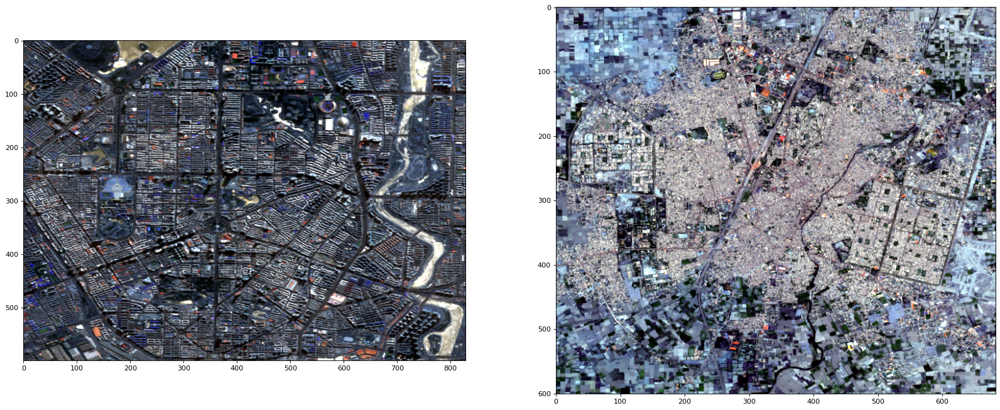

8_b.npy 9_a.npy


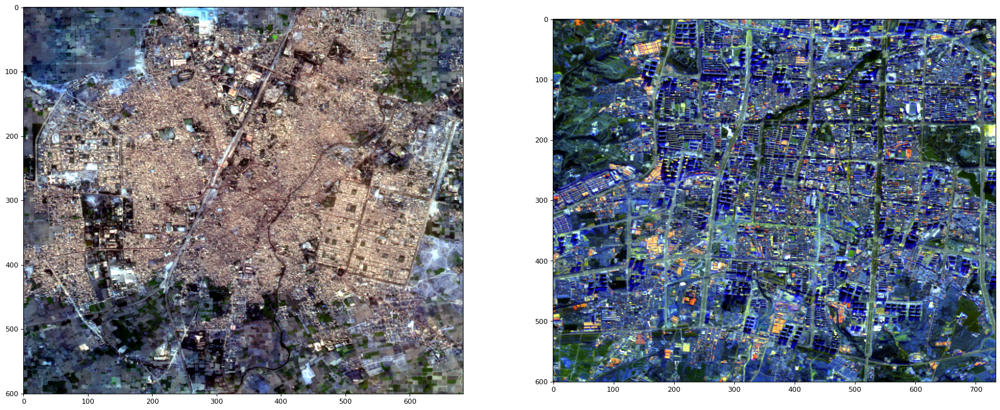

9_b.npy 10_a.npy


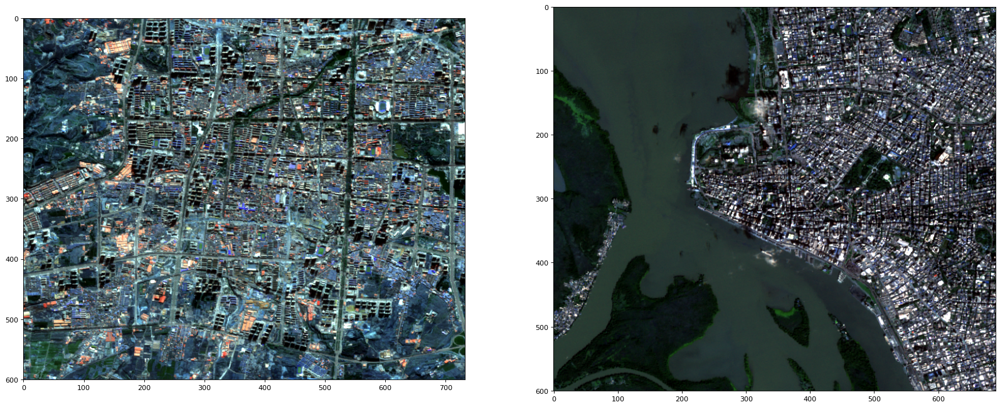

10_b.npy 11_a.npy


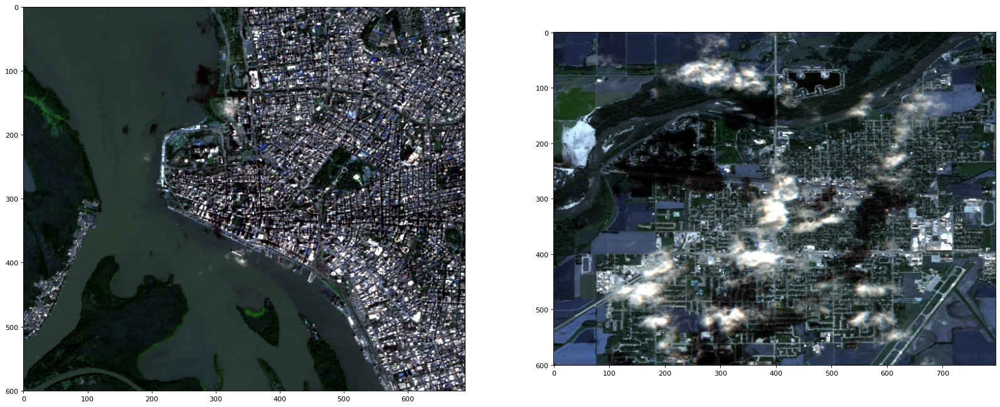

11_b.npy 13_a.npy


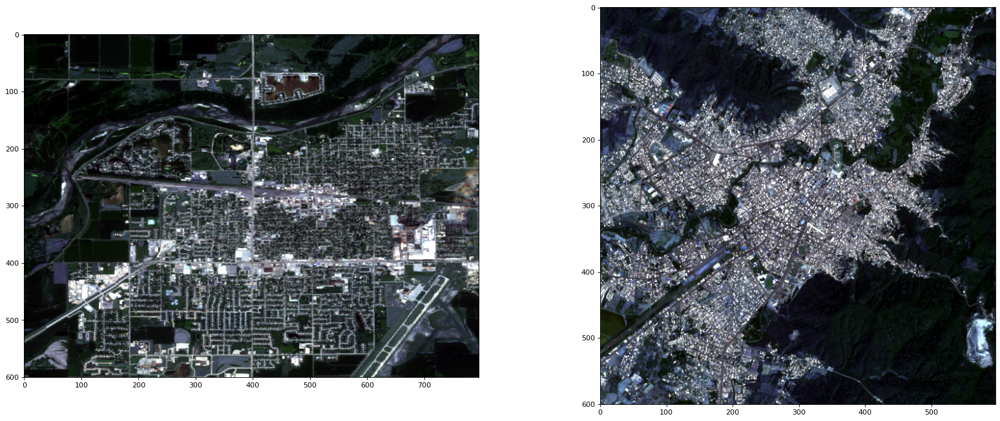

In [ ]:
file_path = os.path.join(PATH_TO_DATASET, FNAME)

with open(file_path, 'r') as file:
    csvreader = csv.reader(file)
    header = next(csvreader)
    list = [row[3] for row in csvreader]

for i in range(10,20,2):
    im_name1 = list[i].strip()
    im_name2 = list[i+1].strip()
    
    I1 = get_s2mtcp_image(os.path.join(PATH_TO_DATASET, 'data_S21C', im_name1))
    I2 = get_s2mtcp_image(os.path.join(PATH_TO_DATASET, 'data_S21C', im_name2))
    
    I1 = clip_1_99_percentile(I1)
    I2 = clip_1_99_percentile(I2)
    
    # I1 = (I1 - I1.min()) / (I1.max() - I1.min())
    # I2 = (I2 - I2.min()) / (I2.max() - I2.min())
    
    print(im_name1, im_name2)
    f, axarr = plt.subplots(nrows=1, ncols=2,figsize=(25, 10),dpi=80)
    axarr[0].imshow(get_rgb_ndarray(I1))
    axarr[1].imshow(get_rgb_ndarray(I2))
    plt.show()

    # plt.subplot(1,2,1)
    # plt.imshow(get_rgb_ndarray(I1))
    # plt.subplot(1,2,2)
    # plt.imshow(get_rgb_ndarray(I2))
    # plt.show()